In [1]:
import sys
import os
from glob import glob
sys.path.append("../NEAT")
from NEATModels import NEATDynamic, nets
from NEATModels.config  import dynamic_config
from NEATUtils import helpers
from NEATUtils.helpers import save_json, load_json
os.environ["CUDA_VISIBLE_DEVICES"]="0"
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"


Using TensorFlow backend.


In [2]:
npz_directory = '/home/sancere/Kepler/FinalONEATTraining/Divisionbin2m4modelV1/'
npz_name = 'divisionbin2m4V1.npz'
npz_val_name = 'divisionbin2m4valV1.npz'
model_dir = '/home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/'
#Model name based on wether it is residual or sequntial ONEAT network
model_name = 'divisionm4d47.h5'

In [3]:
division_categories_json = model_dir + 'DivisionCategories.json'
key_categories = load_json(division_categories_json)
division_cord_json = model_dir + 'DivisionCord.json'
key_cord = load_json(division_cord_json)

#For ORNET use residual = True and for OSNET use residual = False
residual = False
#NUmber of starting convolutional filters, is doubled down with increasing depth
startfilter = 48
#CNN network start layer, mid layers and lstm layer kernel size
start_kernel = 7
lstm_kernel = 3
mid_kernel = 3
#Network depth has to be 9n + 2, n= 3 or 4 is optimal for Notum dataset
depth = 47
#Size of the gradient descent length vector, start small and use callbacks to get smaller when reaching the minima
learning_rate = 1.0E-6
#For stochastic gradient decent, the batch size used for computing the gradients
batch_size = 8
# use softmax for single event per box, sigmoid for multi event per box
lstm_hidden_unit = 16
#Training epochs, longer the better with proper chosen learning rate
epochs = 250
nboxes = 1
#The inbuilt model stride which is equal to the nulber of times image was downsampled by the network
show = True

size_tminus = 4
size_tplus = 5
imagex = 64
imagey = 64

In [4]:
config = dynamic_config(npz_directory =npz_directory, npz_name = npz_name, npz_val_name = npz_val_name, 
                         
                         key_categories = key_categories, key_cord = key_cord, nboxes = nboxes, imagex = imagex,
                         imagey = imagey, size_tminus = size_tminus, size_tplus =size_tplus, epochs = epochs,
                         residual = residual, depth = depth, start_kernel = start_kernel, mid_kernel = mid_kernel,
                         lstm_kernel = lstm_kernel, lstm_hidden_unit = lstm_hidden_unit, show = show,
                         startfiler = startfilter, batch_size = batch_size, model_name = model_name)

config_json = config.to_json()

print(config)
save_json(config_json, model_dir + os.path.splitext(model_name)[0] + '_Parameter.json')

dynamic_config(batch_size=8, box_vector=6, categories=2, depth=47, epochs=250, imagex=64, imagey=64, key_categories={'Normal': 0, 'Division': 1}, key_cord={'x': 0, 'y': 1, 't': 2, 'h': 3, 'w': 4, 'c': 5}, learning_rate=0.0001, lstm_hidden_unit=16, lstm_kernel=3, mid_kernel=3, model_name='divisionm4d47.h5', multievent=False, nboxes=1, npz_directory='/home/sancere/Kepler/FinalONEATTraining/Divisionbin2m4modelV1/', npz_name='divisionbin2m4V1.npz', npz_val_name='divisionbin2m4valV1.npz', residual=False, show=True, size_tminus=4, size_tplus=5, start_kernel=7, startfilter=48, stride=4, yolo_v0=True, yolo_v1=False, yolo_v2=False)


number of  images:	 8498
image size (3D):		 (10, 64, 64)
axes:				 STXYC
channels in / out:		 1
number of  images:	 448
image size (3D):		 (10, 64, 64)
axes:				 STXYC
channels in / out:		 1
6
(8498, 1, 1, 8) 1


/home/sancere/anaconda3/envs/tensorflowGPU/lib/python3.7/site-packages/sklearn/utils/validation.py:72: FutureWarning: Pass classes=[0], y=[0 0 0 ... 0 0 0] as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  "will result in an error", FutureWarning)
2021-07-06 10:17:05.771507: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-07-06 10:17:05.833428: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:17:00.0 name: Quadro RTX 6000 computeCapability: 7.5
coreClock: 1.77GHz coreCount: 72 deviceMemorySize: 23.64GiB deviceMemoryBandwidth: 625.94GiB/s
2021-07-06 10:17:05.833685: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2021-07-06 10:17:05.835315: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynam

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 10, None, Non 0                                            
__________________________________________________________________________________________________
time_distributed_1 (TimeDistrib (None, 10, None, Non 2400        input_1[0][0]                    
__________________________________________________________________________________________________
conv3d_1 (Conv3D)               (None, 10, None, Non 16512       input_1[0][0]                    
__________________________________________________________________________________________________
time_distributed_2 (TimeDistrib (None, 10, None, Non 192         time_distributed_1[0][0]         
____________________________________________________________________________________________

Train on 8498 samples, validate on 448 samples
Epoch 1/250


2021-07-06 10:17:27.208349: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudnn.so.7
2021-07-06 10:17:28.415988: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10


8498/8498 [==============================] - 852s 100ms/step - loss: 1.7120 - accuracy: 0.7863 - val_loss: 1.5733 - val_accuracy: 0.9196

Epoch 00001: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


<Figure size 432x288 with 0 Axes>

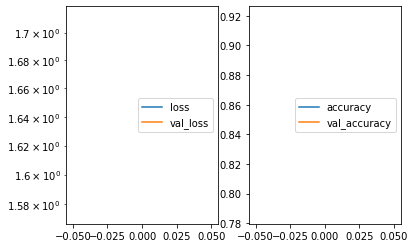

Predicted cell: Normal Probability: [[0.9999962]]
True Cell type: Normal
x [[0.487187]]
True positional value x 0.5
y [[0.47756663]]
True positional value y 0.5
t [[0.4576719]]
True positional value t 0.4444444444444444
h [[0.24496031]]
True positional value h 0.453125
w [[0.27675432]]
True positional value w 0.34375
c [[0.50074536]]
True positional value c 1.0


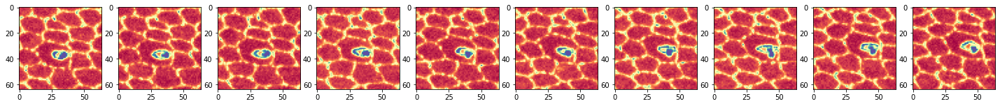

Epoch 2/250
8498/8498 [==============================] - 827s 97ms/step - loss: 1.4412 - accuracy: 0.9525 - val_loss: 1.3985 - val_accuracy: 0.9531

Epoch 00002: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


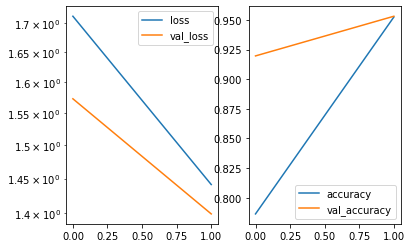

Predicted cell: Division Probability: [[0.9926196]]
True Cell type: Division
x [[0.4934055]]
True positional value x 0.5
y [[0.50244886]]
True positional value y 0.5
t [[0.45948756]]
True positional value t 0.4444444444444444
h [[0.39656734]]
True positional value h 0.40625
w [[0.42068326]]
True positional value w 0.375
c [[0.50323945]]
True positional value c 1.0


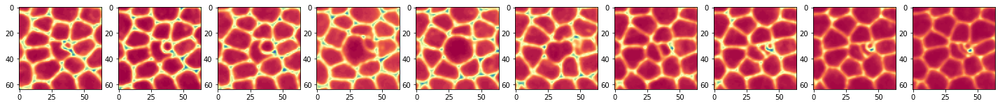

Epoch 3/250
8498/8498 [==============================] - 825s 97ms/step - loss: 1.3594 - accuracy: 0.9758 - val_loss: 1.3733 - val_accuracy: 0.9665

Epoch 00003: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


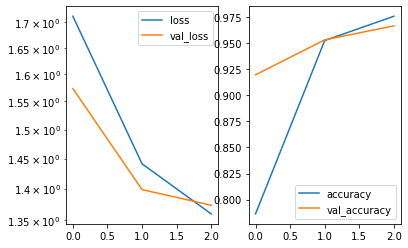

Predicted cell: Normal Probability: [[0.8871194]]
True Cell type: Normal
x [[0.49814144]]
True positional value x 0.5
y [[0.49890864]]
True positional value y 0.5
t [[0.45823583]]
True positional value t 0.4444444444444444
h [[0.18376948]]
True positional value h 0.125
w [[0.16634406]]
True positional value w 0.125
c [[0.55027]]
True positional value c 1.0


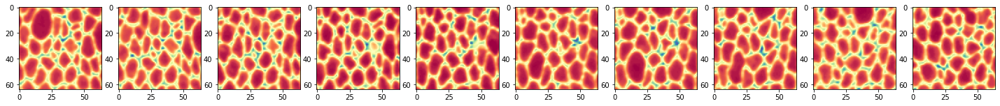

Epoch 4/250
8498/8498 [==============================] - 825s 97ms/step - loss: 1.3320 - accuracy: 0.9816 - val_loss: 1.3931 - val_accuracy: 0.9710

Epoch 00004: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


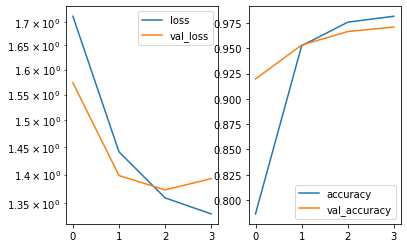

Predicted cell: Division Probability: [[0.8421647]]
True Cell type: Normal
x [[0.49626786]]
True positional value x 0.5
y [[0.48746207]]
True positional value y 0.5
t [[0.47003865]]
True positional value t 0.4444444444444444
h [[0.34974784]]
True positional value h 0.34375
w [[0.36695802]]
True positional value w 0.34375
c [[0.52024233]]
True positional value c 1.0


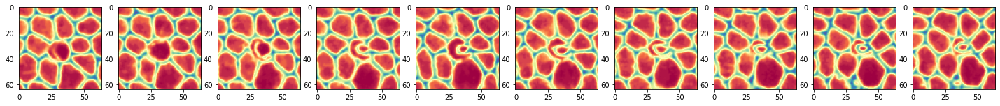

Epoch 5/250
8498/8498 [==============================] - 825s 97ms/step - loss: 1.3088 - accuracy: 0.9882 - val_loss: 1.3811 - val_accuracy: 0.9754

Epoch 00005: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


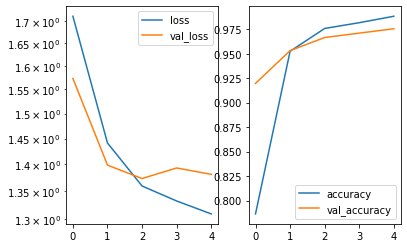

Predicted cell: Division Probability: [[0.999592]]
True Cell type: Division
x [[0.5130101]]
True positional value x 0.5
y [[0.50669557]]
True positional value y 0.5
t [[0.44067878]]
True positional value t 0.4444444444444444
h [[0.26689103]]
True positional value h 0.296875
w [[0.33656532]]
True positional value w 0.34375
c [[0.51395714]]
True positional value c 1.0


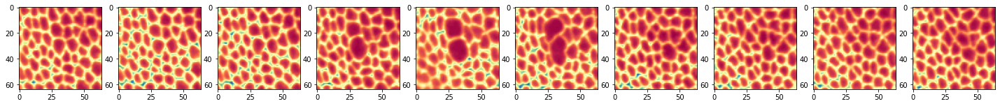

Epoch 6/250
8498/8498 [==============================] - 823s 97ms/step - loss: 1.3028 - accuracy: 0.9887 - val_loss: 1.3234 - val_accuracy: 0.9844

Epoch 00006: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


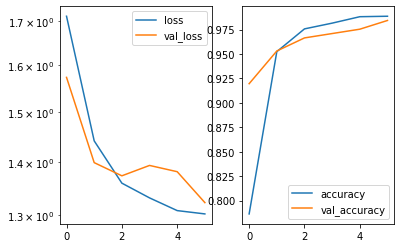

Predicted cell: Normal Probability: [[1.]]
True Cell type: Normal
x [[0.5232943]]
True positional value x 0.5
y [[0.51083314]]
True positional value y 0.5
t [[0.44687086]]
True positional value t 0.4444444444444444
h [[0.3854524]]
True positional value h 0.71875
w [[0.45240936]]
True positional value w 0.71875
c [[0.46150944]]
True positional value c 1.0


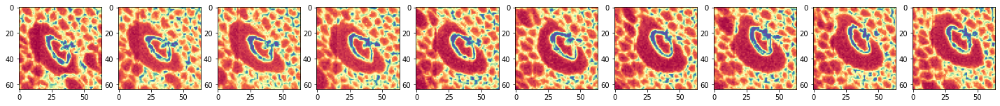

Epoch 7/250
8498/8498 [==============================] - 823s 97ms/step - loss: 1.2942 - accuracy: 0.9901 - val_loss: 1.3150 - val_accuracy: 0.9821

Epoch 00007: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


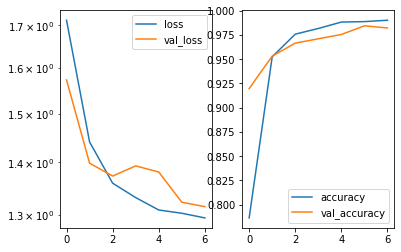

Predicted cell: Normal Probability: [[1.]]
True Cell type: Normal
x [[0.47047415]]
True positional value x 0.5
y [[0.4817515]]
True positional value y 0.5
t [[0.45436388]]
True positional value t 0.4444444444444444
h [[0.30233082]]
True positional value h 0.4375
w [[0.32077554]]
True positional value w 0.359375
c [[0.5593116]]
True positional value c 1.0


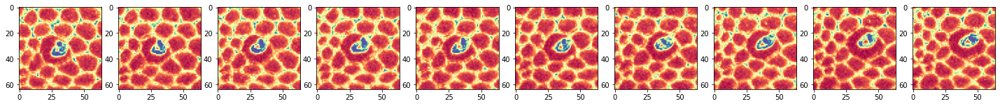

Epoch 8/250
8498/8498 [==============================] - 820s 97ms/step - loss: 1.2719 - accuracy: 0.9945 - val_loss: 1.3212 - val_accuracy: 0.9754

Epoch 00008: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


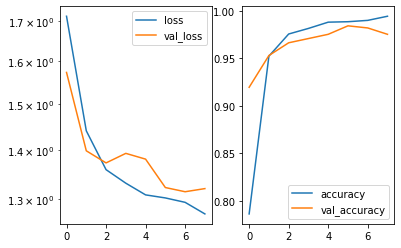

Predicted cell: Normal Probability: [[0.5808331]]
True Cell type: Division
x [[0.47825718]]
True positional value x 0.5
y [[0.4862023]]
True positional value y 0.5
t [[0.44244468]]
True positional value t 0.4444444444444444
h [[0.30001613]]
True positional value h 0.3125
w [[0.24541694]]
True positional value w 0.3125
c [[0.49144602]]
True positional value c 1.0


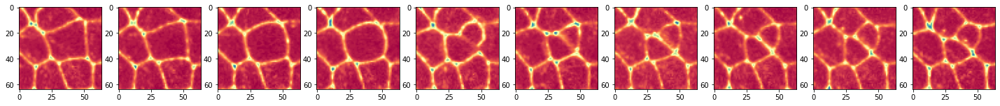

Epoch 9/250
8498/8498 [==============================] - 820s 97ms/step - loss: 1.2699 - accuracy: 0.9956 - val_loss: 1.2957 - val_accuracy: 0.9821

Epoch 00009: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


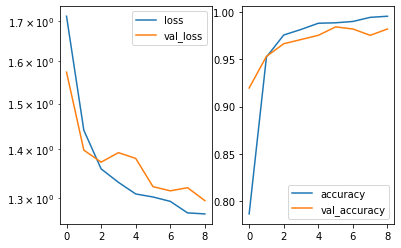

Predicted cell: Division Probability: [[0.99999905]]
True Cell type: Division
x [[0.503318]]
True positional value x 0.5
y [[0.5076489]]
True positional value y 0.5
t [[0.4396167]]
True positional value t 0.4444444444444444
h [[0.42480546]]
True positional value h 0.4375
w [[0.50035566]]
True positional value w 0.4375
c [[0.5803329]]
True positional value c 1.0


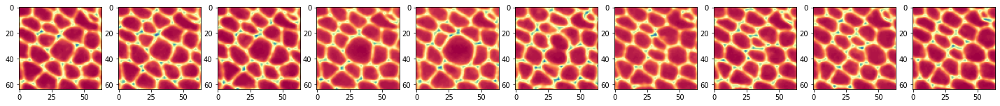

Epoch 10/250
8498/8498 [==============================] - 821s 97ms/step - loss: 1.2609 - accuracy: 0.9956 - val_loss: 1.3141 - val_accuracy: 0.9799

Epoch 00010: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


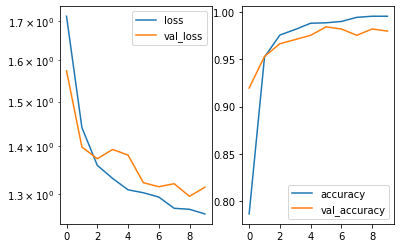

Predicted cell: Normal Probability: [[1.]]
True Cell type: Normal
x [[0.48957732]]
True positional value x 0.5
y [[0.48524803]]
True positional value y 0.5
t [[0.43065062]]
True positional value t 0.4444444444444444
h [[0.4404889]]
True positional value h 0.4375
w [[0.4337662]]
True positional value w 0.359375
c [[0.48780766]]
True positional value c 1.0


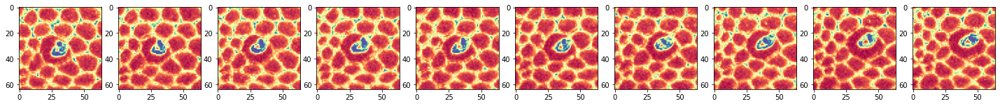

Epoch 11/250
8498/8498 [==============================] - 821s 97ms/step - loss: 1.2559 - accuracy: 0.9961 - val_loss: 1.3099 - val_accuracy: 0.9866

Epoch 00011: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


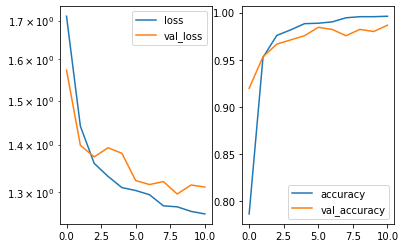

Predicted cell: Division Probability: [[0.9977342]]
True Cell type: Division
x [[0.49820083]]
True positional value x 0.5
y [[0.5098243]]
True positional value y 0.5
t [[0.44069475]]
True positional value t 0.4444444444444444
h [[0.33972007]]
True positional value h 0.40625
w [[0.3697126]]
True positional value w 0.46875
c [[0.51671046]]
True positional value c 1.0


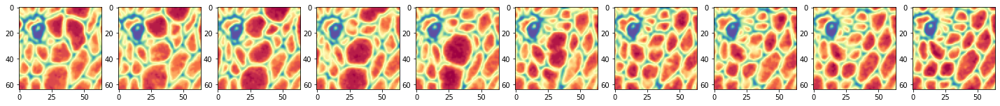

Epoch 12/250
8498/8498 [==============================] - 821s 97ms/step - loss: 1.2428 - accuracy: 0.9974 - val_loss: 1.2788 - val_accuracy: 0.9888

Epoch 00012: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


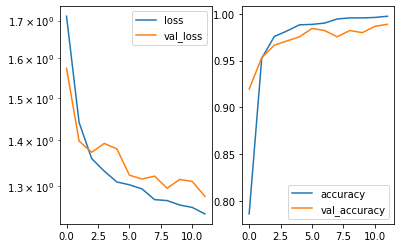

Predicted cell: Division Probability: [[0.9999647]]
True Cell type: Division
x [[0.49042857]]
True positional value x 0.5
y [[0.50413465]]
True positional value y 0.5
t [[0.4559165]]
True positional value t 0.4444444444444444
h [[0.46899217]]
True positional value h 0.46875
w [[0.49410358]]
True positional value w 0.453125
c [[0.49430245]]
True positional value c 1.0


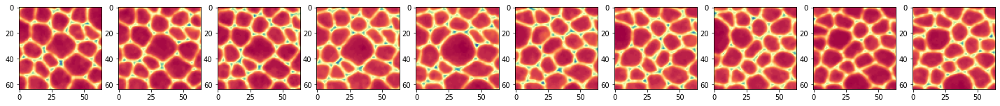

Epoch 13/250
8498/8498 [==============================] - 821s 97ms/step - loss: 1.2419 - accuracy: 0.9960 - val_loss: 1.2741 - val_accuracy: 0.9844

Epoch 00013: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


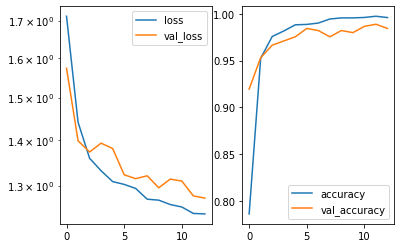

Predicted cell: Division Probability: [[0.9966085]]
True Cell type: Division
x [[0.5004638]]
True positional value x 0.5
y [[0.49161184]]
True positional value y 0.5
t [[0.43483487]]
True positional value t 0.4444444444444444
h [[0.42409915]]
True positional value h 0.5625
w [[0.45298615]]
True positional value w 0.515625
c [[0.5687911]]
True positional value c 1.0


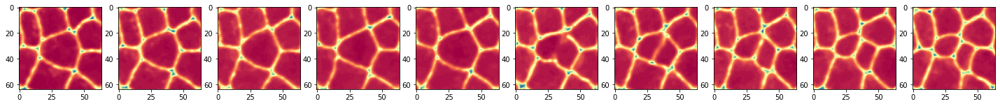

Epoch 14/250
8498/8498 [==============================] - 820s 97ms/step - loss: 1.2311 - accuracy: 0.9987 - val_loss: 1.2623 - val_accuracy: 0.9933

Epoch 00014: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


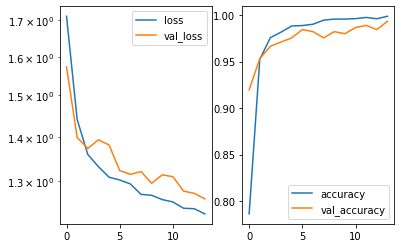

Predicted cell: Division Probability: [[0.99988556]]
True Cell type: Division
x [[0.4867645]]
True positional value x 0.5
y [[0.48545805]]
True positional value y 0.5
t [[0.44810015]]
True positional value t 0.4444444444444444
h [[0.3721374]]
True positional value h 0.109375
w [[0.3698929]]
True positional value w 0.21875
c [[0.50142425]]
True positional value c 1.0


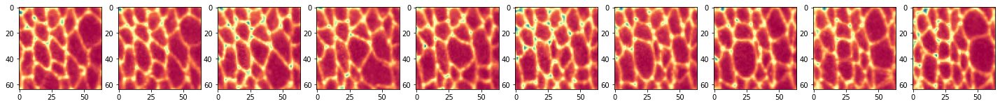

Epoch 15/250
8498/8498 [==============================] - 821s 97ms/step - loss: 1.2272 - accuracy: 0.9987 - val_loss: 1.2523 - val_accuracy: 0.9955

Epoch 00015: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


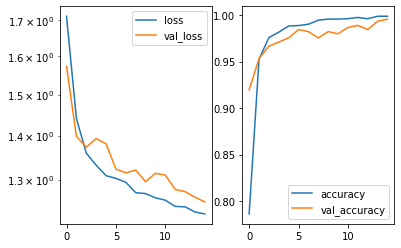

Predicted cell: Division Probability: [[0.999076]]
True Cell type: Division
x [[0.50074935]]
True positional value x 0.5
y [[0.4982502]]
True positional value y 0.5
t [[0.43461537]]
True positional value t 0.4444444444444444
h [[0.2644534]]
True positional value h 0.3125
w [[0.40016082]]
True positional value w 0.40625
c [[0.52348423]]
True positional value c 1.0


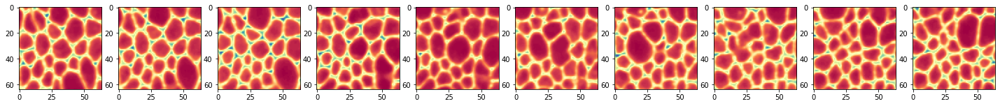

Epoch 16/250
8498/8498 [==============================] - 820s 97ms/step - loss: 1.2301 - accuracy: 0.9947 - val_loss: 1.2740 - val_accuracy: 0.9911

Epoch 00016: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


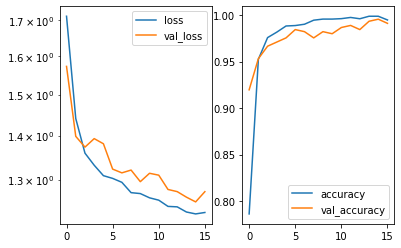

Predicted cell: Division Probability: [[0.9999778]]
True Cell type: Division
x [[0.49351045]]
True positional value x 0.5
y [[0.49028283]]
True positional value y 0.5
t [[0.44105488]]
True positional value t 0.4444444444444444
h [[0.3947497]]
True positional value h 0.34375
w [[0.48096496]]
True positional value w 0.578125
c [[0.5798665]]
True positional value c 1.0


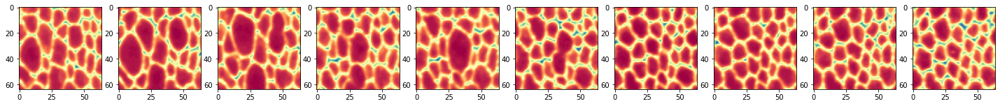

Epoch 17/250
8498/8498 [==============================] - 821s 97ms/step - loss: 1.2232 - accuracy: 0.9955 - val_loss: 1.2589 - val_accuracy: 0.9911

Epoch 00017: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


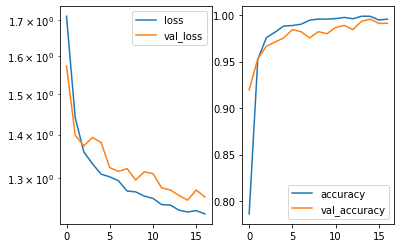

Predicted cell: Normal Probability: [[0.99999595]]
True Cell type: Normal
x [[0.4917353]]
True positional value x 0.5
y [[0.49583173]]
True positional value y 0.5
t [[0.45320594]]
True positional value t 0.4444444444444444
h [[0.14545666]]
True positional value h 0.125
w [[0.13030308]]
True positional value w 0.125
c [[0.5755525]]
True positional value c 1.0


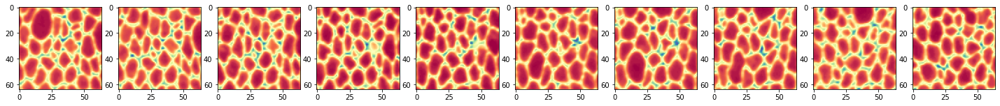

Epoch 18/250
8498/8498 [==============================] - 829s 98ms/step - loss: 1.2101 - accuracy: 0.9981 - val_loss: 1.2438 - val_accuracy: 0.9911

Epoch 00018: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


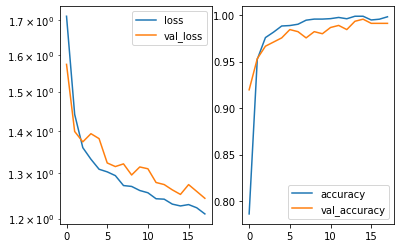

Predicted cell: Division Probability: [[0.9999653]]
True Cell type: Division
x [[0.4963092]]
True positional value x 0.5
y [[0.4866039]]
True positional value y 0.5
t [[0.44926992]]
True positional value t 0.4444444444444444
h [[0.49437895]]
True positional value h 0.5625
w [[0.4111983]]
True positional value w 0.34375
c [[0.47613433]]
True positional value c 1.0


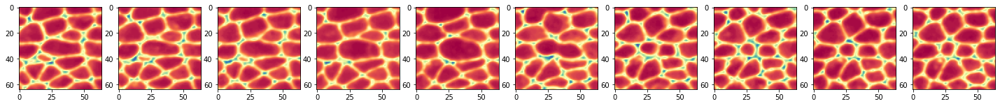

Epoch 19/250
8498/8498 [==============================] - 824s 97ms/step - loss: 1.2048 - accuracy: 0.9988 - val_loss: 1.2614 - val_accuracy: 0.9844

Epoch 00019: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


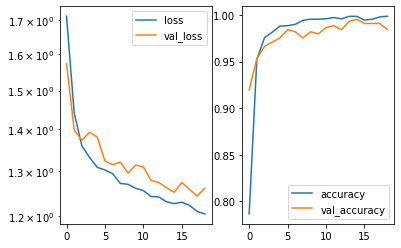

Predicted cell: Division Probability: [[0.99997294]]
True Cell type: Division
x [[0.50157475]]
True positional value x 0.5
y [[0.5028859]]
True positional value y 0.5
t [[0.4388178]]
True positional value t 0.4444444444444444
h [[0.24794875]]
True positional value h 0.234375
w [[0.31032896]]
True positional value w 0.390625
c [[0.5361679]]
True positional value c 1.0


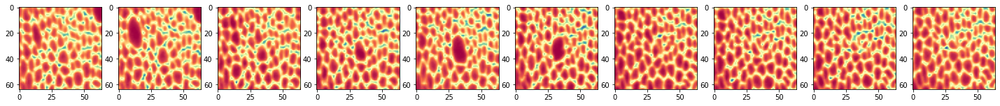

Epoch 20/250
8498/8498 [==============================] - 823s 97ms/step - loss: 1.1991 - accuracy: 0.9992 - val_loss: 1.2275 - val_accuracy: 0.9911

Epoch 00020: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


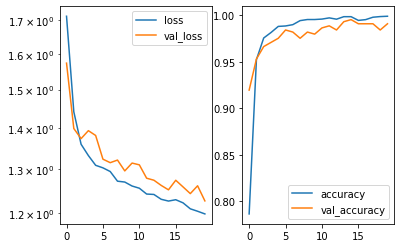

Predicted cell: Division Probability: [[0.99500775]]
True Cell type: Division
x [[0.5036962]]
True positional value x 0.5
y [[0.49558496]]
True positional value y 0.5
t [[0.45033297]]
True positional value t 0.4444444444444444
h [[0.4005737]]
True positional value h 0.40625
w [[0.47860327]]
True positional value w 0.5
c [[0.53108406]]
True positional value c 1.0


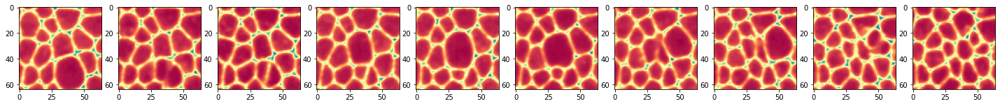

Epoch 21/250
8498/8498 [==============================] - 822s 97ms/step - loss: 1.1916 - accuracy: 0.9992 - val_loss: 1.2377 - val_accuracy: 0.9866

Epoch 00021: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


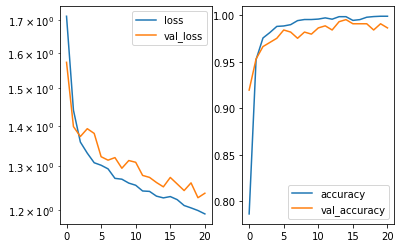

Predicted cell: Normal Probability: [[1.]]
True Cell type: Normal
x [[0.5050626]]
True positional value x 0.5
y [[0.49684694]]
True positional value y 0.5
t [[0.46470988]]
True positional value t 0.4444444444444444
h [[0.312598]]
True positional value h 0.265625
w [[0.28511354]]
True positional value w 0.203125
c [[0.53466785]]
True positional value c 1.0


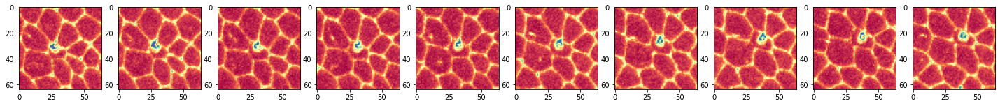

Epoch 22/250
8498/8498 [==============================] - 828s 97ms/step - loss: 1.1854 - accuracy: 0.9994 - val_loss: 1.2324 - val_accuracy: 0.9866

Epoch 00022: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


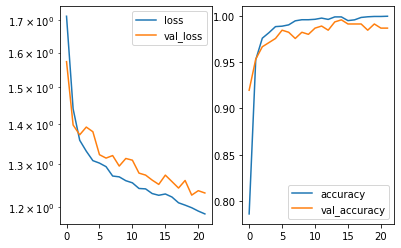

Predicted cell: Division Probability: [[0.9999869]]
True Cell type: Division
x [[0.51384825]]
True positional value x 0.5
y [[0.51009005]]
True positional value y 0.5
t [[0.44885182]]
True positional value t 0.4444444444444444
h [[0.3343608]]
True positional value h 0.359375
w [[0.3963844]]
True positional value w 0.46875
c [[0.52828914]]
True positional value c 1.0


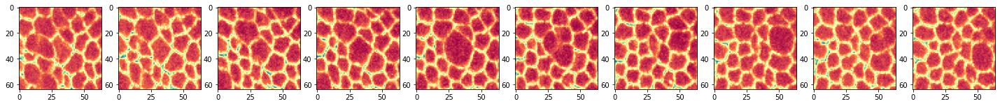

Epoch 23/250
8498/8498 [==============================] - 818s 96ms/step - loss: 1.1793 - accuracy: 0.9995 - val_loss: 1.2265 - val_accuracy: 0.9866

Epoch 00023: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


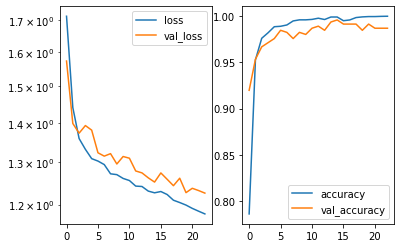

Predicted cell: Division Probability: [[0.99997616]]
True Cell type: Division
x [[0.5017659]]
True positional value x 0.5
y [[0.4919044]]
True positional value y 0.5
t [[0.4416687]]
True positional value t 0.4444444444444444
h [[0.4437376]]
True positional value h 0.5625
w [[0.33950406]]
True positional value w 0.34375
c [[0.48314545]]
True positional value c 1.0


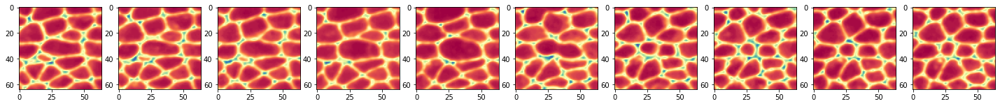

Epoch 24/250
8498/8498 [==============================] - 818s 96ms/step - loss: 1.1764 - accuracy: 0.9988 - val_loss: 1.2517 - val_accuracy: 0.9844

Epoch 00024: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


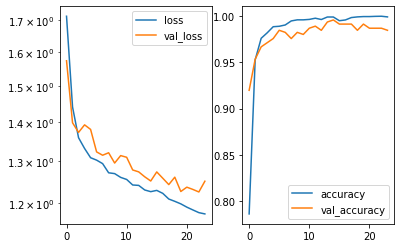

Predicted cell: Normal Probability: [[0.9999932]]
True Cell type: Normal
x [[0.48768437]]
True positional value x 0.5
y [[0.48516473]]
True positional value y 0.5
t [[0.43646982]]
True positional value t 0.4444444444444444
h [[0.3104108]]
True positional value h 0.3125
w [[0.2798744]]
True positional value w 0.265625
c [[0.49925974]]
True positional value c 1.0


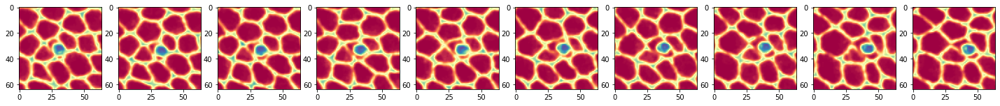

Epoch 25/250
8498/8498 [==============================] - 817s 96ms/step - loss: 1.1710 - accuracy: 0.9994 - val_loss: 1.2117 - val_accuracy: 0.9866

Epoch 00025: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


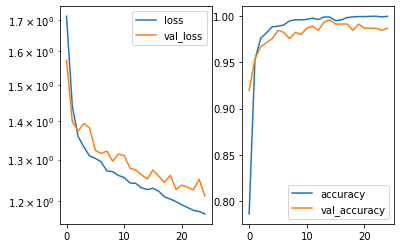

Predicted cell: Division Probability: [[0.99989223]]
True Cell type: Division
x [[0.499623]]
True positional value x 0.5
y [[0.5063066]]
True positional value y 0.5
t [[0.4466171]]
True positional value t 0.4444444444444444
h [[0.34048986]]
True positional value h 0.3125
w [[0.35240412]]
True positional value w 0.390625
c [[0.59302]]
True positional value c 1.0


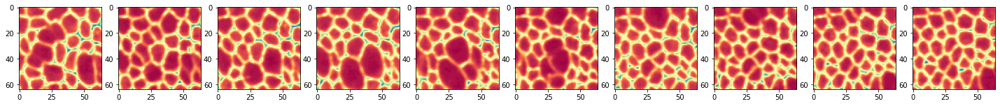

Epoch 26/250
8498/8498 [==============================] - 818s 96ms/step - loss: 1.1645 - accuracy: 0.9993 - val_loss: 1.2488 - val_accuracy: 0.9844

Epoch 00026: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


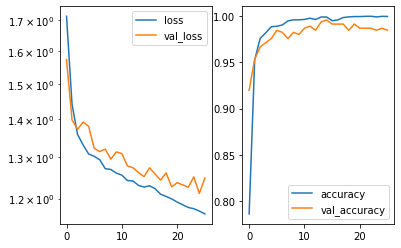

Predicted cell: Normal Probability: [[1.]]
True Cell type: Normal
x [[0.49982017]]
True positional value x 0.5
y [[0.5036239]]
True positional value y 0.5
t [[0.44862178]]
True positional value t 0.4444444444444444
h [[0.42790702]]
True positional value h 0.46875
w [[0.44260558]]
True positional value w 0.3125
c [[0.5197706]]
True positional value c 1.0


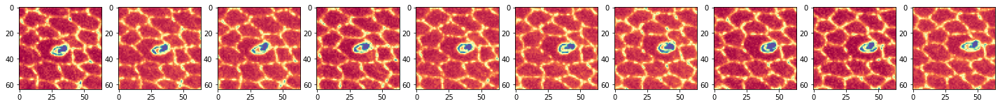

Epoch 27/250
8498/8498 [==============================] - 817s 96ms/step - loss: 1.1607 - accuracy: 0.9991 - val_loss: 1.1997 - val_accuracy: 0.9933

Epoch 00027: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


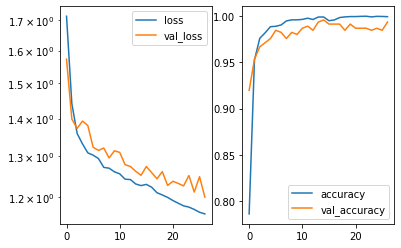

Predicted cell: Division Probability: [[0.9996562]]
True Cell type: Division
x [[0.50376457]]
True positional value x 0.5
y [[0.5035074]]
True positional value y 0.5
t [[0.44543102]]
True positional value t 0.4444444444444444
h [[0.30026758]]
True positional value h 0.328125
w [[0.3714686]]
True positional value w 0.34375
c [[0.5549778]]
True positional value c 1.0


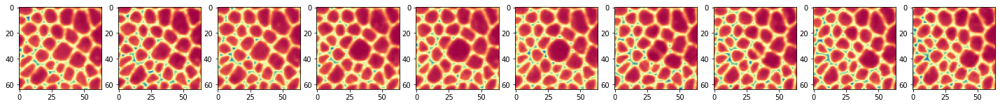

Epoch 28/250
8498/8498 [==============================] - 819s 96ms/step - loss: 1.1548 - accuracy: 0.9994 - val_loss: 1.2118 - val_accuracy: 0.9888

Epoch 00028: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


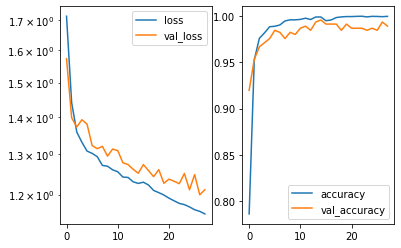

Predicted cell: Normal Probability: [[1.]]
True Cell type: Normal
x [[0.47896546]]
True positional value x 0.5
y [[0.50233716]]
True positional value y 0.5
t [[0.43917003]]
True positional value t 0.4444444444444444
h [[0.33385566]]
True positional value h 0.359375
w [[0.32472718]]
True positional value w 0.359375
c [[0.50526375]]
True positional value c 1.0


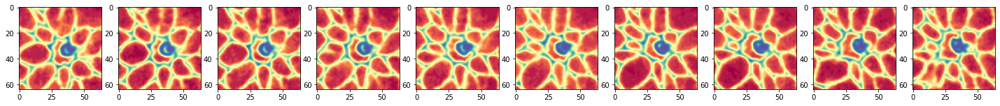

Epoch 29/250
8498/8498 [==============================] - 818s 96ms/step - loss: 1.1489 - accuracy: 0.9994 - val_loss: 1.1882 - val_accuracy: 0.9911

Epoch 00029: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


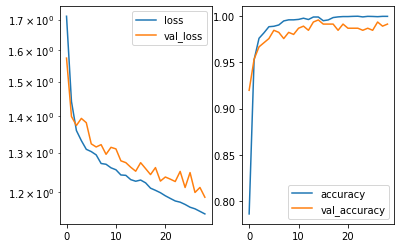

Predicted cell: Division Probability: [[0.99993134]]
True Cell type: Division
x [[0.4981755]]
True positional value x 0.5
y [[0.4894176]]
True positional value y 0.5
t [[0.4405596]]
True positional value t 0.4444444444444444
h [[0.36752218]]
True positional value h 0.375
w [[0.37254936]]
True positional value w 0.375
c [[0.53813064]]
True positional value c 1.0


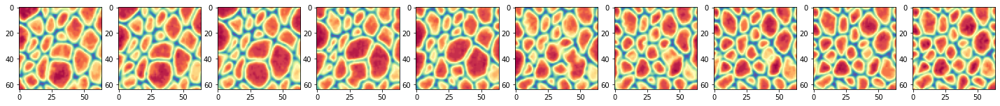

Epoch 30/250
8498/8498 [==============================] - 817s 96ms/step - loss: 1.1441 - accuracy: 0.9996 - val_loss: 1.1973 - val_accuracy: 0.9888

Epoch 00030: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


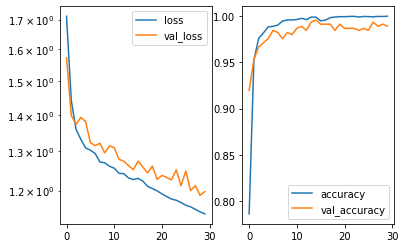

Predicted cell: Division Probability: [[0.99999845]]
True Cell type: Division
x [[0.49866977]]
True positional value x 0.5
y [[0.5027212]]
True positional value y 0.5
t [[0.457542]]
True positional value t 0.4444444444444444
h [[0.4238427]]
True positional value h 0.390625
w [[0.58871853]]
True positional value w 0.5625
c [[0.5437616]]
True positional value c 1.0


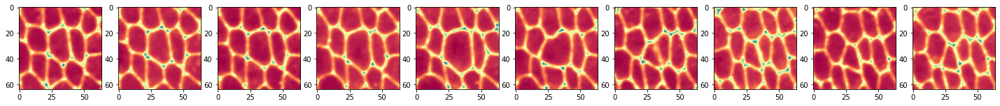

Epoch 31/250
8498/8498 [==============================] - 832s 98ms/step - loss: 1.1389 - accuracy: 0.9994 - val_loss: 1.1724 - val_accuracy: 0.9955

Epoch 00031: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


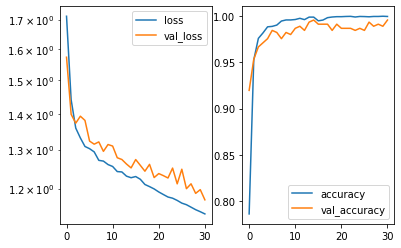

Predicted cell: Division Probability: [[0.9999764]]
True Cell type: Division
x [[0.50148654]]
True positional value x 0.5
y [[0.49161515]]
True positional value y 0.5
t [[0.44641945]]
True positional value t 0.4444444444444444
h [[0.32132062]]
True positional value h 0.328125
w [[0.4891854]]
True positional value w 0.421875
c [[0.55563706]]
True positional value c 1.0


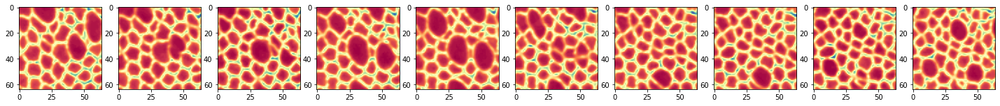

Epoch 32/250
8498/8498 [==============================] - 837s 98ms/step - loss: 1.1334 - accuracy: 0.9994 - val_loss: 1.1958 - val_accuracy: 0.9888

Epoch 00032: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


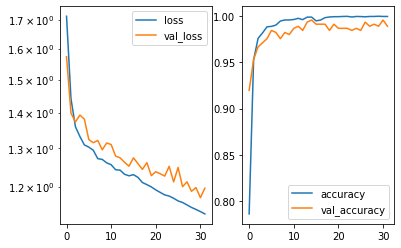

Predicted cell: Division Probability: [[0.9999918]]
True Cell type: Division
x [[0.4976266]]
True positional value x 0.5
y [[0.5116208]]
True positional value y 0.5
t [[0.44387946]]
True positional value t 0.4444444444444444
h [[0.23056972]]
True positional value h 0.140625
w [[0.30831483]]
True positional value w 0.171875
c [[0.52254635]]
True positional value c 1.0


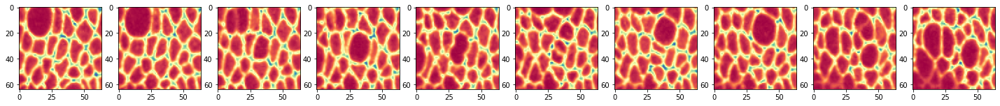

Epoch 33/250
8498/8498 [==============================] - 824s 97ms/step - loss: 1.1299 - accuracy: 0.9996 - val_loss: 1.1619 - val_accuracy: 0.9955

Epoch 00033: saving model to /home/sancere/Kepler/FinalONEATTraining/EverydayneatmodelV1/divisionm4d47.h5


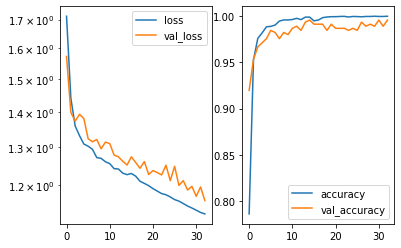

Predicted cell: Normal Probability: [[0.9998865]]
True Cell type: Normal
x [[0.5032778]]
True positional value x 0.5
y [[0.50292474]]
True positional value y 0.5
t [[0.4559267]]
True positional value t 0.4444444444444444
h [[0.354365]]
True positional value h 0.3125
w [[0.3183286]]
True positional value w 0.25
c [[0.46877632]]
True positional value c 1.0


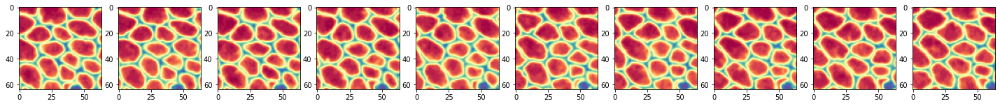

Epoch 34/250
3408/8498 [===========>..................] - ETA: 8:15 - loss: 1.1254 - accuracy: 0.9997

In [ ]:
Train = NEATDynamic(config, model_dir, model_name)

Train.loadData()

Train.TrainModel()
